# **Overview**

Who doesn't love music? Music can transform your mood at worse, and lifts up your soul at best. There are songs from decades ago (but no, no revealing ages here) that if I hear it playing now, can still evoke the same deep emotions I felt from during that time I first heart it, and I am very certain I ain't the only one.

Gone are the days of cassette tapes, CDs, and even MP3s (RIP iPod) - though interestingly enough, Vinyl is still very much alive. Spotify has certainly disrupted the music industry. Even though it is certainly not the first music service (who has heard of and used Pandora or Rhapsody?), Spotify is without a doubt the most popular one. It is like Facebook is to Friendster and MySpace.

Let's take a look into what songs were being streamed - the dataset under analysis is a free dataset available on Kaggle, and features  2-decade data from 1999 to 2019.

# **Import Required Libraries**

In [1]:
import pandas as pd
import numpy as np
import datetime as dt

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
import seaborn as sns

import os
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',None)
init_notebook_mode(connected=True)

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/top-hits-spotify-from-20002019/songs_normalize.csv


In [2]:
df = pd.read_csv('/kaggle/input/top-hits-spotify-from-20002019/songs_normalize.csv')
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist            2000 non-null   object 
 1   song              2000 non-null   object 
 2   duration_ms       2000 non-null   int64  
 3   explicit          2000 non-null   bool   
 4   year              2000 non-null   int64  
 5   popularity        2000 non-null   int64  
 6   danceability      2000 non-null   float64
 7   energy            2000 non-null   float64
 8   key               2000 non-null   int64  
 9   loudness          2000 non-null   float64
 10  mode              2000 non-null   int64  
 11  speechiness       2000 non-null   float64
 12  acousticness      2000 non-null   float64
 13  instrumentalness  2000 non-null   float64
 14  liveness          2000 non-null   float64
 15  valence           2000 non-null   float64
 16  tempo             2000 non-null   float64


* artist: Name of the Artist.
* song: Name of the Track.
* duration_ms: Duration of the track in milliseconds.
* explicit: The lyrics or content of a song or a music video contain one or more of the criteria which could be considered offensive or unsuitable for children.
* year: Release Year of the track.
* popularity: The higher the value the more popular the song is.
* danceability: Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.
* energy: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity.
* key: The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1.
* loudness: The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typically range between -60 and 0 db.
* mode: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.
* speechiness: Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.
* acousticness: A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.
* instrumentalness: Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.
* liveness: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.
* valence: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).
* tempo: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.
* genre: Genre of the track.

In [3]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
artist,2000,835,Rihanna,25,NaN,NaN,NaN,NaN,NaN,NaN,NaN
song,2000,1879,Sorry,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration_ms,2000.0,NaN,NaN,NaN,228748.1245,39136.569008,113000.0,203580.0,223279.5,248133.0,484146.0
explicit,2000,2,False,1449,NaN,NaN,NaN,NaN,NaN,NaN,NaN
year,2000.0,NaN,NaN,NaN,2009.494,5.85996,1998.0,2004.0,2010.0,2015.0,2020.0
popularity,2000.0,NaN,NaN,NaN,59.8725,21.335577,0.0,56.0,65.5,73.0,89.0
danceability,2000.0,NaN,NaN,NaN,0.667438,0.140416,0.129,0.581,0.676,0.764,0.975
energy,2000.0,NaN,NaN,NaN,0.720366,0.152745,0.0549,0.622,0.736,0.839,0.999
key,2000.0,NaN,NaN,NaN,5.378,3.615059,0.0,2.0,6.0,8.0,11.0
loudness,2000.0,NaN,NaN,NaN,-5.512434,1.933482,-20.514,-6.49025,-5.285,-4.16775,-0.276


Now we have a sense of the dataset, let's move on to some exploratory data analysis (EDA).

In [4]:
df = df.loc[df['year'] < 2020]
df = df.loc[df['year'] > 1998]

# **Exploratory Data Analysis (EDA)**

In [5]:
import ydata_profiling as pp
import warnings
warnings.filterwarnings('ignore')
pp.ProfileReport(df, title = 'Pandas Profiling report of dataset', html = {'style':{'full_width': True}})

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Previously, I would go through each of the steps manually, such as checking for missing values, duplicates and so on, but I found this profiling report package 'ydata_profiling' to be such a life saver! (and yes I got lazy but why re reinvent the wheel?)

From the above report, we can easily gain some quick insights with just a couple of lines of code above.

Duplicates: **59 (2.9% duplicates)** - *we need to handle this*

Missing values: **0.0%** *i.e. no nulls - we are all set*

Correlation:
* **energy** is highly overall correlated with **loudness**

# **Data Analysis & Visualization**

In [6]:
df.drop_duplicates(inplace=True)

In [7]:
## corr heatmap
num_cols  = df._get_numeric_data().columns
df_num = df[num_cols]
df_corr = df_num.corr() # Generate correlation matrix

import plotly.figure_factory as ff
x = list(df_corr.columns)
y = list(df_corr.index)
z = np.array(df_corr)

fig = ff.create_annotated_heatmap(
    z,
    x = x,
    y = y ,
    annotation_text = np.around(z, decimals=1),
    hoverinfo='z',
    colorscale='Tropic'
    )
fig.show()

Artist
* There are 835 distinct artists
* This is about 41.8% of total count

In [8]:
df.artist.value_counts()

artist
Rihanna           23
Drake             23
Eminem            21
Calvin Harris     20
Britney Spears    19
                  ..
INNA               1
Big Tymers         1
DJ Sammy           1
Cam’ron            1
Blanco Brown       1
Name: count, Length: 832, dtype: int64

In [9]:
fig = px.histogram(df, x='artist', barmode='group'
             , height=800, width=1200
             , color_discrete_sequence=px.colors.diverging.Spectral).update_xaxes(categoryorder="total descending")

                                                                                                                                                    
fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

Let's do a word cloud from scratch, just for the fun of it.

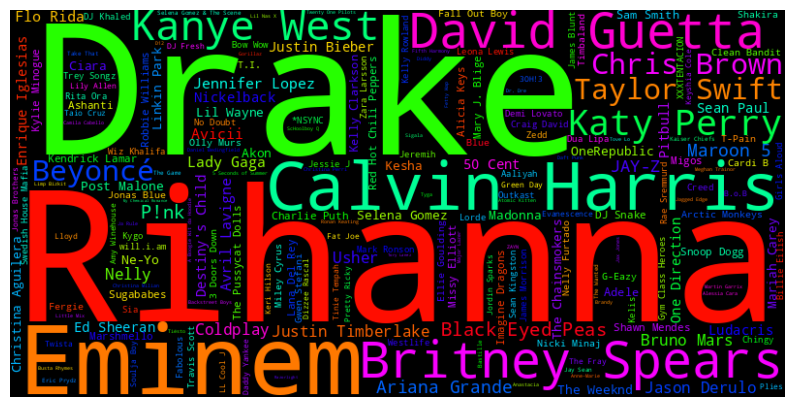

In [10]:
## let's do a word cloud from scratch

# first we need to get the data in shape
wc_artist = df.artist.value_counts()

# here we are converting the value count results into a dataframe for easi manipulation
wc_artist = wc_artist.reset_index().rename(columns={"index": "artist", 0: "count"}) 

# next we need to convert the count df into a dict
wc_artist_dict = wc_artist.set_index('artist').to_dict()['count']


# final step - lets create a word cloud based on generate from freqencies
from wordcloud import WordCloud

wc = WordCloud(width=800, height=400, max_words=200, colormap='gist_rainbow_r').generate_from_frequencies(wc_artist_dict)
plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

Voila! There you have it. As you can see, Rihanna and Drake clearly the top performers! (in the period of the analysis dataset anyway)

Let's do a quick word cloud for Genres as well. I have a hunch what it is going to be but let's see.

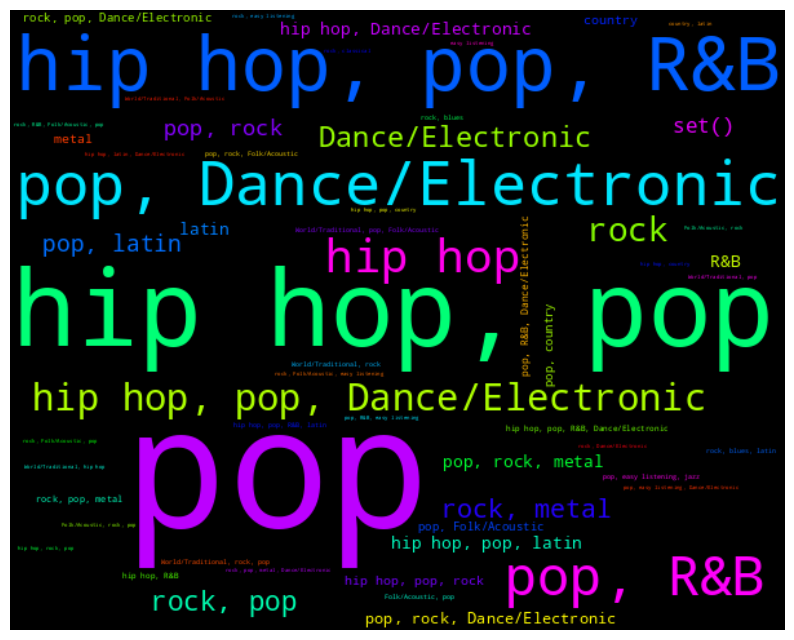

In [11]:
wc_genre = df.genre.value_counts()
wc_genre = wc_genre.reset_index().rename(columns={"index": "genre", 0: "count"}) 

# next we need to convert the count df into a dict
wc_genre_dict = wc_genre.set_index('genre').to_dict()['count']


# final step - lets create a word cloud based on generate from freqencies
from wordcloud import WordCloud

wc = WordCloud(width=600, height=480, max_words=200, colormap='gist_rainbow_r').generate_from_frequencies(wc_genre_dict)
plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

Oh, what happened there? This is because the Genres data column has multiple concatenated values. 

Let's try to clean it up.

In [12]:
df = df.assign(genre=df['genre'].str.split(",")).explode("genre")
df['genre'] = df['genre'].str.strip()
df.drop_duplicates(inplace=True)

df.genre.value_counts()


genre
pop                  1579
hip hop               748
R&B                   436
Dance/Electronic      380
rock                  225
metal                  64
latin                  63
set()                  22
country                20
Folk/Acoustic          20
World/Traditional       9
easy listening          7
blues                   4
jazz                    2
classical               1
Name: count, dtype: int64

Wait a minute, something seems to be off. Can you spot it?

In [13]:
df.loc[df['genre']=='set()']

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
95,Wheatus,Teenage Dirtbag,241666,True,1999,71,0.625,0.850,4,-3.904,1,0.0495,0.346000,0.000233,0.1740,0.633,94.661,set()
216,Las Ketchup,The Ketchup Song (Aserejé) - Spanglish Version,213973,False,2002,66,0.607,0.923,1,-6.777,1,0.0948,0.019300,0.000001,0.0924,0.868,184.819,set()
291,Blazin' Squad,Crossroads - Radio Edit,188693,False,2012,40,0.661,0.746,4,-5.153,1,0.0420,0.109000,0.000000,0.3250,0.502,144.188,set()
428,George Michael,Amazing,265826,False,2004,57,0.805,0.754,10,-6.825,0,0.0394,0.088400,0.000002,0.1170,0.880,128.429,set()
455,DJ Casper,Cha Cha Slide - Hardino Mix,222146,False,2004,51,0.853,0.911,11,-6.722,0,0.1250,0.043600,0.005710,0.2870,0.802,131.012,set()
481,Eamon,Fuck It (I Don't Want You Back),225106,True,2004,64,0.828,0.653,0,-6.245,0,0.0653,0.214000,0.000003,0.0404,0.575,68.507,set()
545,Brian McFadden,Almost Here,229826,False,2004,42,0.561,0.452,9,-7.324,0,0.0336,0.409000,0.000000,0.1060,0.316,77.984,set()
645,Meck,Thunder in My Heart Again (Radio Edit),189800,False,2005,46,0.679,0.922,2,-4.670,0,0.0294,0.000241,0.690000,0.0697,0.806,129.016,set()
710,Ida Corr,Let Me Think About It,151973,False,2012,43,0.762,0.754,0,-3.425,0,0.0460,0.000220,0.066500,0.1460,0.715,129.026,set()
729,Camille Jones,The Creeps - Fedde Le Grand Radio Mix,152333,False,2006,17,0.847,0.861,6,-6.632,1,0.0603,0.278000,0.029000,0.0626,0.724,127.894,set()


We will need to handle the above. Seems the data was not proper from source. But in this case, this is only a small handful, and no common theme. 

For the purposes of this exercise, I am just going to remove this all together.

If there is a significant amount, we may wish to consult the contact at the data source, or have alternative methods to handle.

In [14]:
df.loc[df['genre']=='set()','genre'] = ''
df.loc[df['genre']=='set()']

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre


Okay, we have manipulated the genre column for our usage. Let's get on with the word cloud.

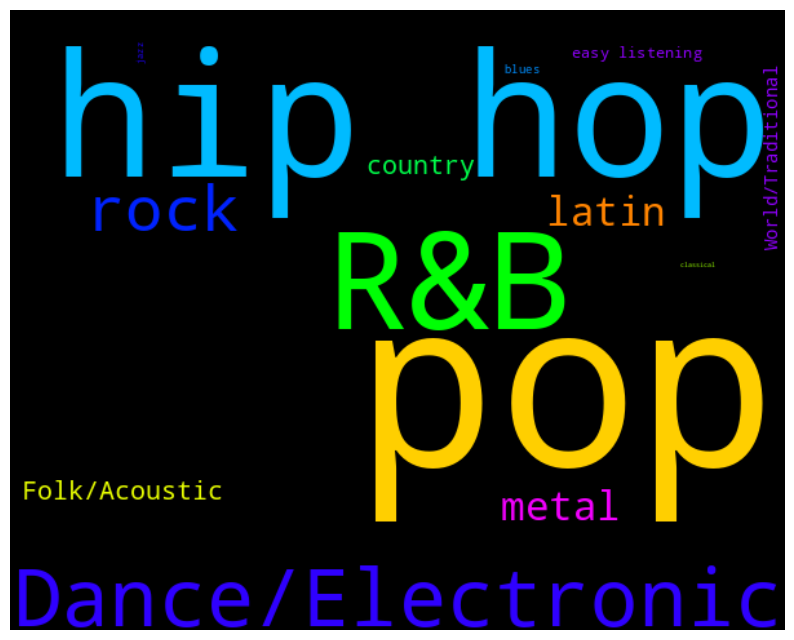

In [15]:


wc_genre = df.genre.value_counts()
wc_genre = wc_genre.reset_index().rename(columns={"index": "genre", 0: "count"}) 

# next we need to convert the count df into a dict
wc_genre_dict = wc_genre.set_index('genre').to_dict()['count']


# final step - lets create a word cloud based on generate from freqencies
from wordcloud import WordCloud

wc = WordCloud(width=600, height=480, max_words=100, colormap='gist_rainbow_r').generate_from_frequencies(wc_genre_dict)
plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [16]:
# plot songs count by year

fig=px.area(df.groupby('year',as_index=False).count()
            .sort_values(by='song',ascending=False).sort_values(by='year'),x='year',y='song',markers=True,labels={'song':'Songs Count'}
            ,color_discrete_sequence=['green'],title='<b>Songs Trends')
fig.update_layout(hovermode='x',title_x=0.5)
fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

In [17]:
fig=px.histogram(df.groupby('genre',as_index=False)
                 .count()
                 .sort_values(by='song',ascending=False)
                 ,x='genre',y='song'
                 ,color_discrete_sequence=['green']
                 ,template='xgridoff',marginal='box'
                 ,title='<b>Songs Distribution by Genres</b>')
fig.update_layout(title_x=0.5)

fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

In [18]:
fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

In [19]:
top50singers_popularity = df.groupby('artist',as_index=False).sum().sort_values(by='popularity',ascending=False).head(50)

fig = px.bar(top50singers_popularity,x='artist',y='popularity',color_discrete_sequence=['green']
       ,template='xgridoff',text='popularity',title='<b>Top 50 Popular Singers')

fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

Next, let's try to display the treemap for the top 50 most popular singers. First we need to filter the main dataset.

To achieve that, we will do the following:

In [20]:
top50singers_list = top50singers_popularity['artist'].tolist()
top50singers_list

top50singers_filtered = df.loc[df['artist'].isin(top50singers_list)]
top50singers_filtered

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160,False,2000,77,0.751,0.834,1,-5.444,0,0.0437,0.30000,0.000018,0.3550,0.894,95.053,pop
6,Eminem,The Real Slim Shady,284200,True,2000,86,0.949,0.661,5,-4.244,0,0.0572,0.03020,0.000000,0.0454,0.760,104.504,hip hop
8,Destiny's Child,Say My Name,271333,False,1999,75,0.713,0.678,5,-3.525,0,0.1020,0.27300,0.000000,0.1490,0.734,138.009,pop
8,Destiny's Child,Say My Name,271333,False,1999,75,0.713,0.678,5,-3.525,0,0.1020,0.27300,0.000000,0.1490,0.734,138.009,R&B
20,Linkin Park,In the End,216880,False,2000,83,0.556,0.864,3,-5.870,0,0.0584,0.00958,0.000000,0.2090,0.400,105.143,rock
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1974,Avicii,SOS (feat. Aloe Blacc),157202,False,2019,71,0.802,0.645,5,-6.181,0,0.0715,0.27200,0.000000,0.1190,0.376,100.001,pop
1974,Avicii,SOS (feat. Aloe Blacc),157202,False,2019,71,0.802,0.645,5,-6.181,0,0.0715,0.27200,0.000000,0.1190,0.376,100.001,Dance/Electronic
1989,Marshmello,One Thing Right,181823,False,2019,73,0.659,0.625,4,-2.253,1,0.0450,0.06440,0.000000,0.5820,0.442,88.042,pop
1989,Marshmello,One Thing Right,181823,False,2019,73,0.659,0.625,4,-2.253,1,0.0450,0.06440,0.000000,0.5820,0.442,88.042,Dance/Electronic


In [21]:
## treemap of the top 50 most popular singers

fig=px.treemap(top50singers_filtered,path=[px.Constant('Spotify'),'artist','genre']
               ,values='popularity',title='<b>Top 50 Most Popular Singers Breakdown'
              ,color='popularity', hover_data=['genre'],
                  color_continuous_scale= px.colors.diverging.Tropic[::-1])
fig.update_traces(root_color='green')
fig.update_layout(title_x=0.5)

fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

Notice anything else interesting in the above treemap? That's right! R&B, hip hop and pop seems to be common themes. I wonder how it will look if ranked in terms of genres.

In [22]:
fig=px.treemap(top50singers_filtered,path=[px.Constant('Spotify'),'genre', 'artist']
               ,values='popularity',title='<b>Top 50 Most Popular Singers Breakdown'
              ,color='popularity', hover_data=['genre'],
                  color_continuous_scale= px.colors.diverging.Tropic[::-1])

fig.update_traces(root_color='green')
fig.update_layout(title_x=0.5)

fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

Previously, from the profiling report we had identified the following:
* energy is highly overall correlated with loudness
* loudness is highly overall correlated with energy

Let us confirm and view the data visualizations.

In [23]:
fig = px.scatter(df,x='energy',y='loudness',color='tempo'
           ,color_continuous_scale=px.colors.sequential.Turbo
           ,template='xgridoff',title='<b>Energy vs Loudness')

fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

In [24]:
fig = px.box(df,x='year',y='duration_ms'
           ,template='xgridoff',title='<b>Duration Trends'
           ,  color_discrete_sequence = ['green']
        , points="outliers", notched=True
            )
fig.update_traces(quartilemethod="exclusive")



fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

We can see the songs are getting shorter ove the years. Is it getting increasingly difficult to get ones undivided attention over periods of time? 

In [25]:
fig = px.box(df,x='year',y='loudness'
           ,template='xgridoff',title='<b>Loudness Trends'
            , color_discrete_sequence = ['green']
        , points="outliers", notched=True
            )
fig.update_traces(quartilemethod="exclusive")

fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

In [26]:
fig=px.area(df[df['explicit']==True].groupby('year',as_index=False).count().sort_values(by='song',ascending=False).sort_values(by='year'),x='year',y='song',labels={'song':'Song Count'},markers=True,color_discrete_sequence=['magenta']
            ,template='xgridoff'
            ,title='<b>Explicit Songs Trends')
fig.update_layout(hovermode='x')

fig.update_layout(
    plot_bgcolor='black'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

# **Conclusions**
* Top genre is clearly pop, hip hope and R&B
* Rihanna is the top performer, both in terms of song releases as well as popularity
* In terms of songs released, Black Eye Peas was actually ranked number 2 just behind Rihanna, But their popularity had declined over the years, and in terms of popularity ranking, it is actually Drake that is placed number 2.
* There is a clear correlation between the energy and the loudness of a song.
* We can also see that songs are getting shorter over the years on the average. Not sure if it is due to the shorter attention span of people. We will require more data to go in that direction but for now this is interesting.
* Explicit context song has shown some fluctuations over the years but definitely there is a steady trend upwards. This may just be people becoming less conscious, and music streaming platforms has evolved the way music is being received and consumed.
